In [ ]:
using Pkg
Pkg.checkout("Plots")

In [37]:
b=[1.01, 1.05, 1.0001, 2]
a = 0.01:0.01:0.04
c=(abs.(b .- a))
println(c)
println(maximum(c))
# for i in c println(i)end
print(a[argmin(b)])

[1.0, 1.03, 0.9701, 1.96]
1.96
0.03

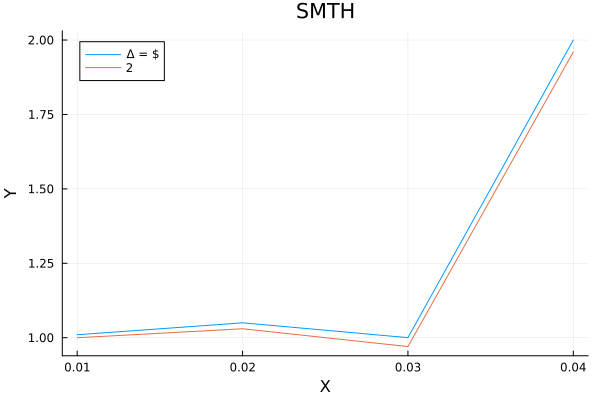

In [42]:
using LaTeXStrings
plot(a,b, label = L"\Delta = $(a[1]) ", title = "SMTH", xlabel = "X", ylabel = "Y")
plot!(a,c,label = "2")

In [4]:


print()

┌ Info: Saved animation to d:\Uni\Computational Physics\Computational_Physics_v24\Computational_Physics_v24\Diffusion_Waves_Shock\figures\waves\wave_equation_solution_3d.gif
└ @ Plots C:\Users\emoeu\.julia\packages\Plots\sxUvK\src\animation.jl:156


Plots.AnimatedGif("d:\\Uni\\Computational Physics\\Computational_Physics_v24\\Computational_Physics_v24\\Diffusion_Waves_Shock\\figures\\waves\\wave_equation_solution_3d.gif")
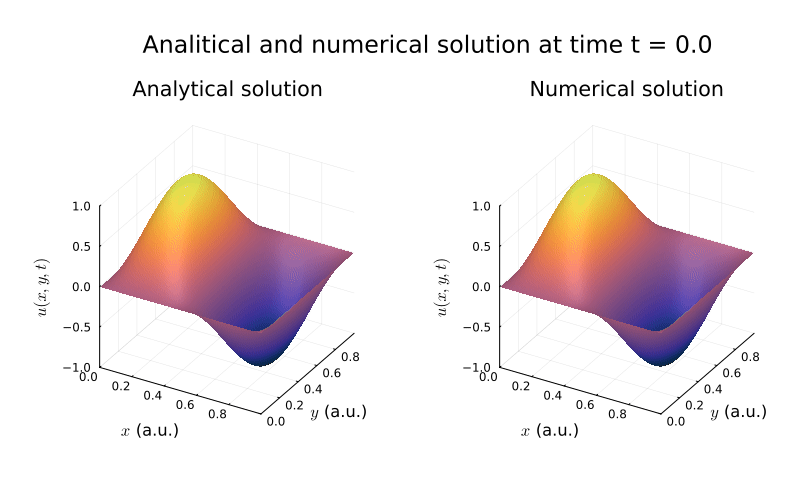

┌ Info: Saved animation to d:\Uni\Computational Physics\Computational_Physics_v24\Computational_Physics_v24\Diffusion_Waves_Shock\figures\waves\wave_equation_solution_ex33.gif
└ @ Plots C:\Users\emoeu\.julia\packages\Plots\sxUvK\src\animation.jl:156


Plots.AnimatedGif("d:\\Uni\\Computational Physics\\Computational_Physics_v24\\Computational_Physics_v24\\Diffusion_Waves_Shock\\figures\\waves\\wave_equation_solution_ex33.gif")
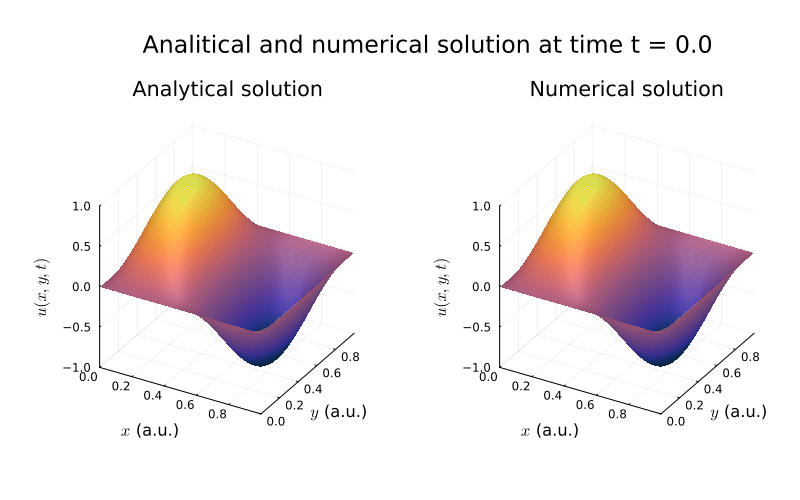

In [9]:
dt = Waves.h/(Waves.c)
endtime = 1.00
timesteps = Int64(div(endtime,dt)+1)::Int64
spacesteps = Waves.spacesteps
time = LinRange(0,endtime, timesteps)
x = Waves.x
y = Waves.y
time = Waves.time
u = zeros(spacesteps, spacesteps, timesteps)
β = Waves.β


u_init = sin.(pi*x') .* sin.(2*pi*y) 
u_init[:,1] .= 0
u_init[:,end] .= 0
u_init[1,:] .= 0
u_init[end,:] .= 0

u[:,:,1] = u_init

u = Waves.solve_u(u, timesteps, β)
u_an = Waves.analytical_solution(x,y,time, spacesteps,timesteps)

anim = @animate for n in 1:timesteps
    p1 = surface(x, y, u_an[:, :, n]', zlim=(-1, 1), c=:thermal, colorbar = false, title = "\n\nAnalytical solution", xlabel = "\$x\$ (a.u.)", ylabel = "\$y\$ (a.u.)", zlabel = "\$u(x,y,t)\$")
    p2 = surface(x, y, u[:, :, n]', zlim=(-1, 1), c=:thermal, colorbar = false, title = "\n\nNumerical solution", xlabel = "\$x\$ (a.u.)", ylabel = "\$y\$ (a.u.)", zlabel = "\$u(x,y,t)\$")
    p = plot(p1,p2, layout= (1,2), size = (800,500), suptitle = "\nAnalitical and numerical solution at time t = $(round(time[n], digits = 4))")
end

gif(anim, "figures/waves/wave_equation_solution_ex33.gif", fps=10)

┌ Info: Saved animation to d:\Uni\Computational Physics\Computational_Physics_v24\Computational_Physics_v24\Diffusion_Waves_Shock\figures\waves\wave_equation_solution_membrane.gif
└ @ Plots C:\Users\emoeu\.julia\packages\Plots\sxUvK\src\animation.jl:156


Plots.AnimatedGif("d:\\Uni\\Computational Physics\\Computational_Physics_v24\\Computational_Physics_v24\\Diffusion_Waves_Shock\\figures\\waves\\wave_equation_solution_membrane.gif")
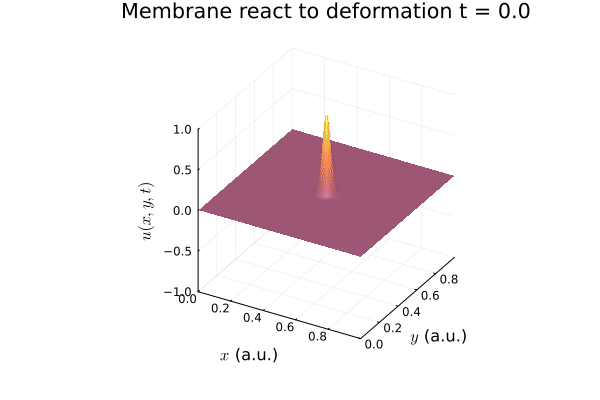